<a href="https://colab.research.google.com/github/Claptar/diploma/blob/main/DE/human_young_vs_old_scanpy/L4_young_vs_old.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies and files

## Install dependencies

In [ ]:
!pip install scanpy[leiden] anndata2ri scikit-misc scvi-tools squidpy gseapy==0.10.8 --quiet

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

## Imports

In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import gseapy
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

Нужно подключить свой гугл диск

In [2]:
dir_path = 'drive/MyDrive/Spatial project/results/'

In [3]:
os.listdir('drive/MyDrive/Spatial project/results/filtered_samples/')

['human.h5ad', 'chimp.h5ad', 'macaque.h5ad', 'spatial_libd_human.h5ad']

In [4]:
# read young human adata object
human_young = sc.read_h5ad(dir_path + 'filtered_samples/human.h5ad')
print(human_young)

# add _young sufix to layer name
human_young.obs.label.replace({"L6a": "L6", "L6b": "L6"}, inplace=True)
human_young.obs.label = human_young.obs.label.astype('str') + '_young'

AnnData object with n_obs × n_vars = 15417 × 19966
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:
# read young human adata object
human_old = sc.read_h5ad(dir_path + 'filtered_samples/spatial_libd_human.h5ad')
print(human_old)

# add _young sufix to layer name
human_old.obs.label = human_old.obs.label.astype('str') + '_old'

AnnData object with n_obs × n_vars = 42588 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_mt_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [6]:
# concat old and young files
adata = an.concat([human_young, human_old], merge='same',uns_merge="unique")
adata.obs_names_make_unique()
adata

/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 58005 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors'
    obsm: 'spatial'

In [7]:
samples = list(adata.uns['spatial'].keys())
samples

['human_759',
 'human_j12',
 'human_j3',
 'human_j4',
 'human_j6',
 '151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676']

In [8]:
del human_old, human_young

# Посмотрим на картинки

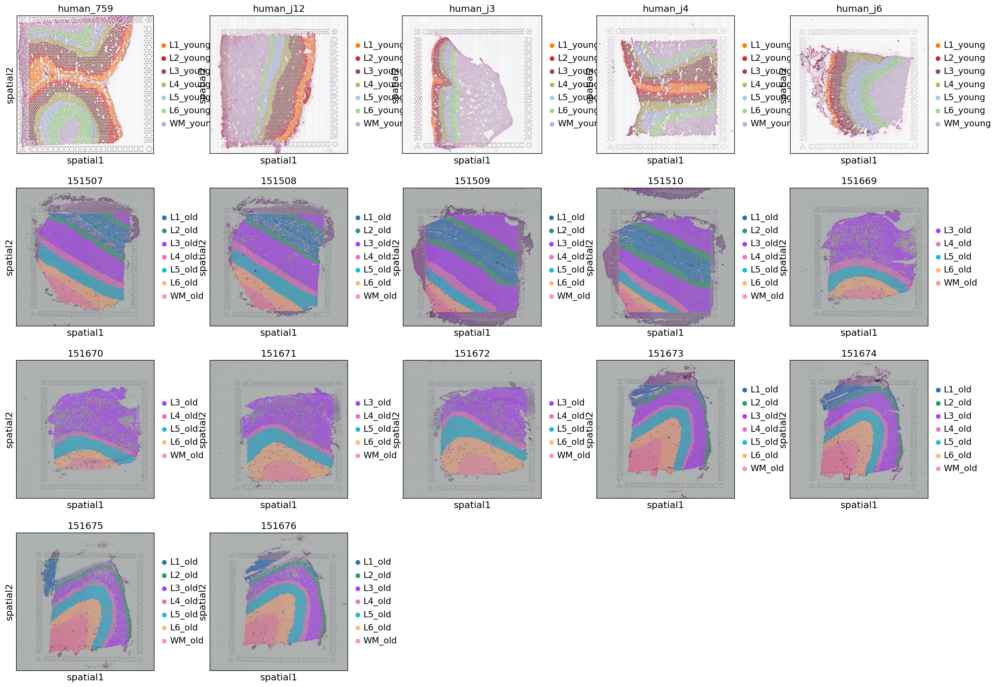

In [9]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', size=1.1, ncols=5, title=samples)

# Differential expression

In [10]:
key = 'DE_L4'
groups = ["L4_young", "L4_old"]

In [11]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:01)


In [12]:
de_adata = adata[adata.obs.label.isin(groups)]
de_adata

View of AnnData object with n_obs × n_vars = 5045 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors', 'label_colors', 'log1p'
    obsm: 'spatial'

## Feature selection

In [13]:
sc.pp.highly_variable_genes(
    adata=de_adata, flavor="seurat", 
    n_top_genes=3000, inplace=True,
    batch_key="sample_id")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:08)


/usr/local/lib/python3.9/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [14]:
highly_variable_genes = de_adata.var[de_adata.var.highly_variable].index.tolist()

## PCA

In [15]:
sc.tl.pca(de_adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


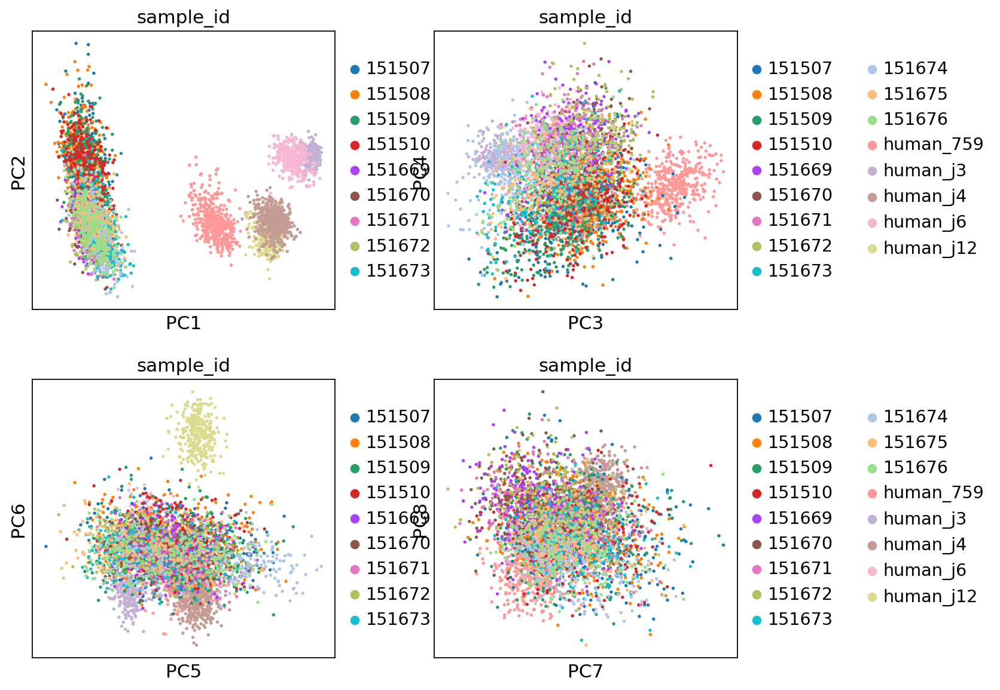

In [16]:
sc.pl.pca(de_adata, color=['sample_id'], components = ['1,2','3,4','5,6','7,8'], ncols=2)

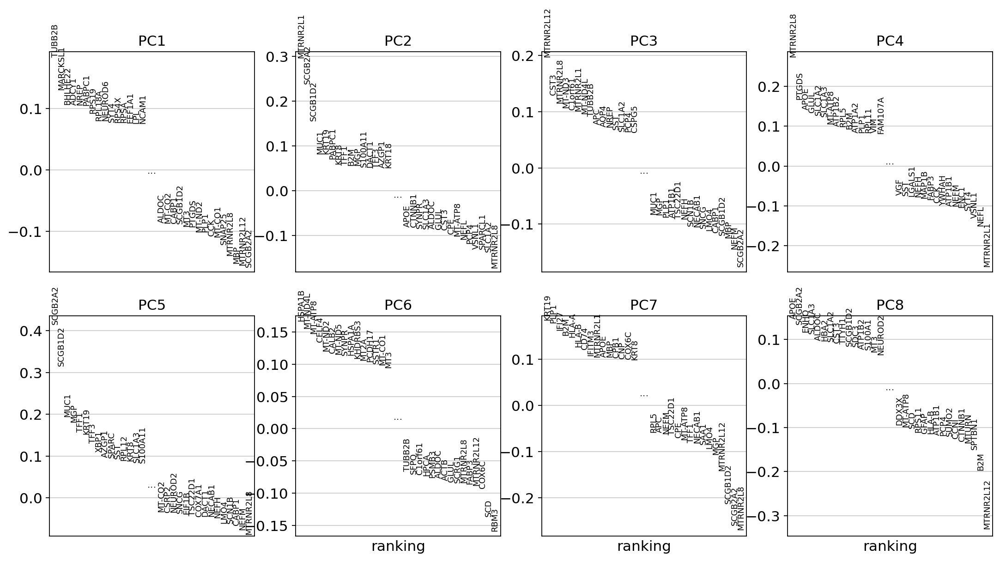

In [17]:
sc.pl.pca_loadings(de_adata, components=[1,2,3,4,5,6,7,8])

Уберем митохондриальные и рибосомные гены

In [18]:
mito = de_adata.var_names.str.startswith('MT-')
hb = de_adata.var_names.str.contains(("^HB[AB]"))
rb = de_adata.var_names.str.contains(("^RP[LS]"))
remove = mito | hb | rb
genes_to_remove = de_adata.var_names[remove].tolist()

keep = np.invert(remove)
print(sum(remove))

de_adata = de_adata[:,keep]

117


In [19]:
# remove genes from `highly_variable_genes`
highly_variable_genes = [gene for gene in highly_variable_genes if gene not in genes_to_remove]

## Rank genes

In [20]:
sc.tl.rank_genes_groups(de_adata, groupby='label', method='wilcoxon', pts=True)
adata.uns[key] = de_adata.uns["rank_genes_groups"]

ranking genes


/usr/local/lib/python3.9/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)


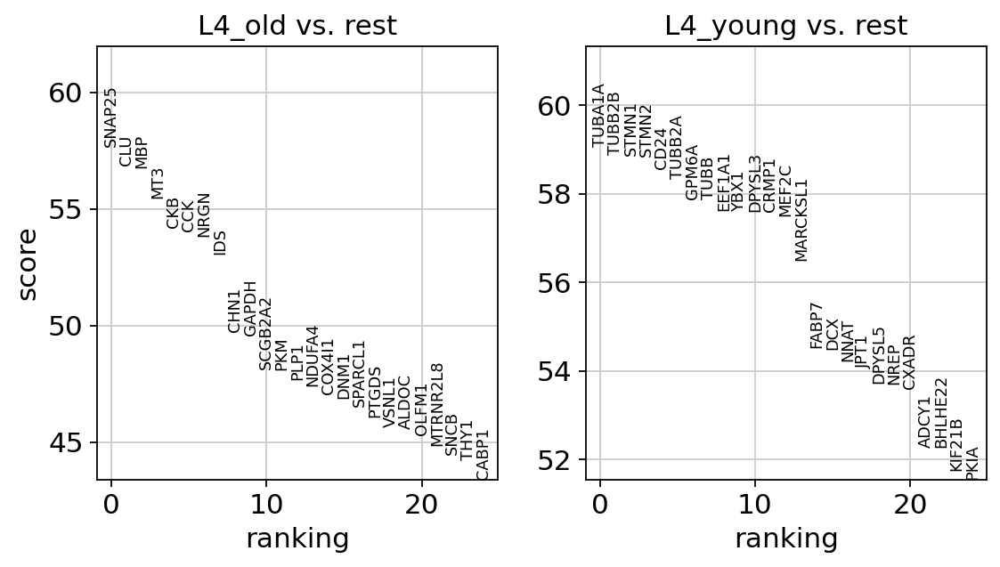

In [21]:
sc.pl.rank_genes_groups(de_adata, n_genes=25, sharey=False)

**TUBA1A** — Microtubules of the eukaryotic cytoskeleton perform essential and diverse functions and are composed of a heterodimer of alpha and beta tubulins

**STMN2** — This gene encodes a member of the stathmin family of phosphoproteins. Stathmin proteins function in microtubule dynamics and signal transduction. The encoded protein plays a regulatory role in neuronal growth and is also thought to be involved in osteogenesis. Reductions in the expression of this gene have been associated with Down's syndrome and Alzheimer's disease.

**CCK** — This gene encodes a member of the gastrin/cholecystokinin family of proteins. The encoded preproprotein is proteolytically processed to generate multiple protein products, including the peptide hormones cholecystokinin-8, -12, -33, and others. The encoded peptides have been shown to regulate gastric acid secretion and food intake. A sulfated form of cholecystokinin-8 may modulate neuronal activity in the brain.

**SNAP25** — Synaptic vesicle membrane docking and fusion is mediated by SNAREs (soluble N-ethylmaleimide-sensitive factor attachment protein receptors) located on the vesicle membrane (v-SNAREs) and the target membrane (t-SNAREs)

**CLU** — The protein encoded by this gene is a secreted chaperone that can under some stress conditions also be found in the cell cytosol. It has been suggested to be involved in several basic biological events such as cell death, tumor progression, and neurodegenerative disorders.

**MT3** — This gene is a member of the metallothionein family of genes. Proteins encoded by this gene family are low in molecular weight, are cysteine-rich, lack aromatic residues, and bind divalent heavy metal ions. This gene family member displays tissue-specific expression, and contains a threonine insert near its N-terminus and a glutamate-rich hexapeptide insert near its C-terminus relative to the proteins encoded by other gene family members.

## Посмотрим на дифф. экспрессированые гены

In [22]:
genes_rank_df = sc.get.rank_genes_groups_df(de_adata, group=groups[0])
genes_rank_df.index = genes_rank_df.names
genes_rank_df['abs_lfc'] = genes_rank_df['logfoldchanges'].abs()
genes_rank_df['abs_scores'] = genes_rank_df['scores'].abs()
genes_rank_df

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,abs_scores
names,,,,,,,,,
TUBA1A,TUBA1A,59.072762,3.797680,0.0,0.0,1.000000,0.916279,3.797680,59.072762
TUBB2B,TUBB2B,58.892376,4.954920,0.0,0.0,1.000000,0.424496,4.954920,58.892376
STMN1,STMN1,58.861309,2.019271,0.0,0.0,1.000000,0.968682,2.019271,58.861309
STMN2,STMN2,58.850590,2.923678,0.0,0.0,1.000000,0.904186,2.923678,58.850590
CD24,CD24,58.563572,5.758765,0.0,0.0,0.996154,0.161550,5.758765,58.563572
...,...,...,...,...,...,...,...,...,...
CKB,CKB,-54.203125,-1.861133,0.0,0.0,0.978571,0.990388,1.861133,54.203125
MT3,MT3,-55.462227,-1.927683,0.0,0.0,0.997802,0.999070,1.927683,55.462227
MBP,MBP,-56.753578,-5.543113,0.0,0.0,0.279121,0.970543,5.543113,56.753578


### Распределение p-value

<Axes: >

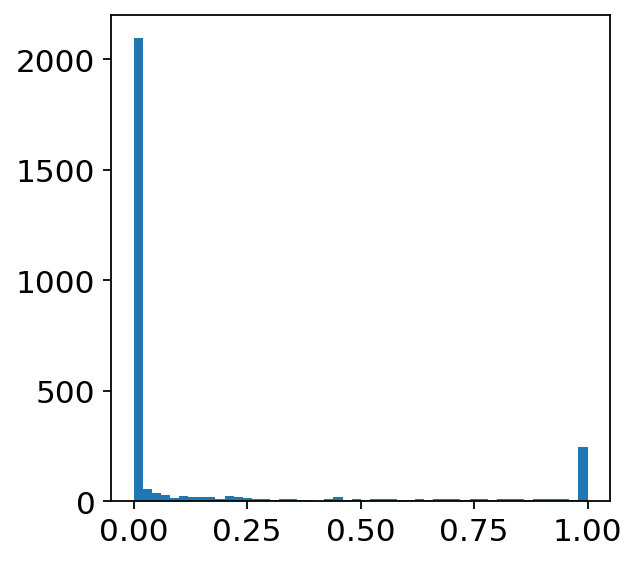

In [23]:
genes_rank_df.loc[highly_variable_genes, 'pvals_adj'].hist(bins=50, grid=False)

Не понимаю на сколько нормально видеть такую картину

### Сравним молодые/старые

In [24]:
top_genes_df = genes_rank_df.loc[highly_variable_genes][(genes_rank_df.pvals_adj < 0.05) &
                                                        (genes_rank_df.pct_nz_group > 0.1) &
                                                        (genes_rank_df.pct_nz_reference > 0.1)].sort_values(by='abs_lfc', ascending=False)
top_genes_df.head()

<ipython-input-24-96267cd2d6a5>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  top_genes_df = genes_rank_df.loc[highly_variable_genes][(genes_rank_df.pvals_adj < 0.05) &


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,abs_scores
names,,,,,,,,,
MBP,MBP,-56.753578,-5.543113,0.0,0.0,0.279121,0.970543,5.543113,56.753578
TUBB2B,TUBB2B,58.892376,4.954920,0.0,0.0,1.000000,0.424496,4.954920,58.892376
CABP1,CABP1,-43.403519,-4.602601,0.0,0.0,0.173077,0.778605,4.602601,43.403519
SNCG,SNCG,-41.068233,-4.106091,0.0,0.0,0.200549,0.755039,4.106091,41.068233
MTRNR2L8,MTRNR2L8,-44.833794,-3.992815,0.0,0.0,0.291758,0.904186,3.992815,44.833794


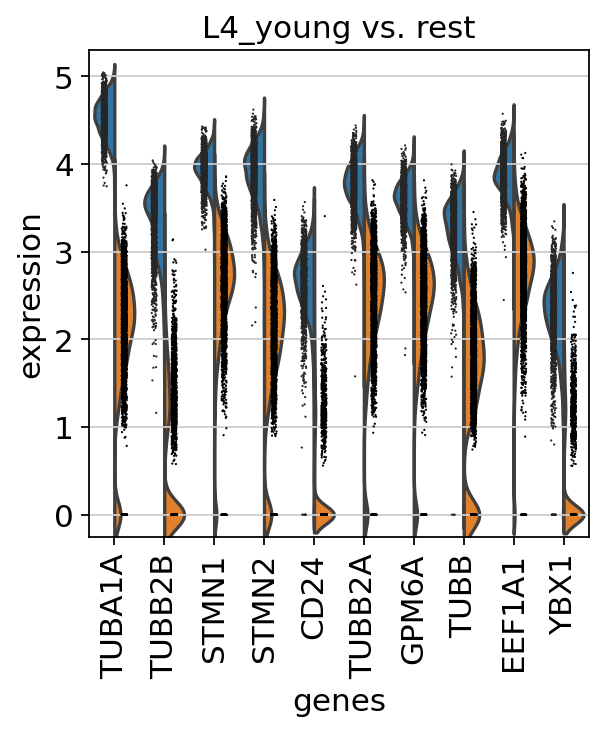

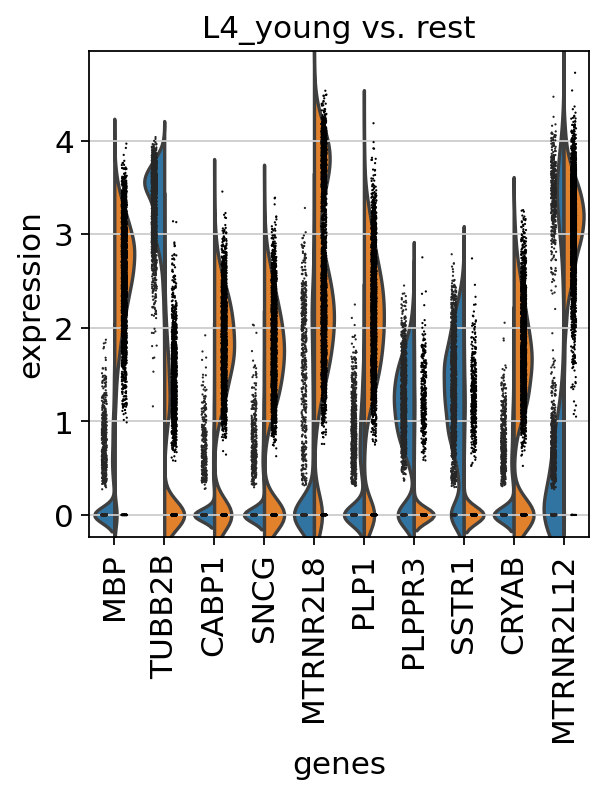

In [25]:
genes1 = genes_rank_df.index[:10].tolist()
genes2 = top_genes_df.index[:10].tolist()
sc.pl.rank_genes_groups_violin(de_adata, gene_names=genes1, groups=groups[0])
sc.pl.rank_genes_groups_violin(de_adata, gene_names=genes2, groups=groups[0])

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


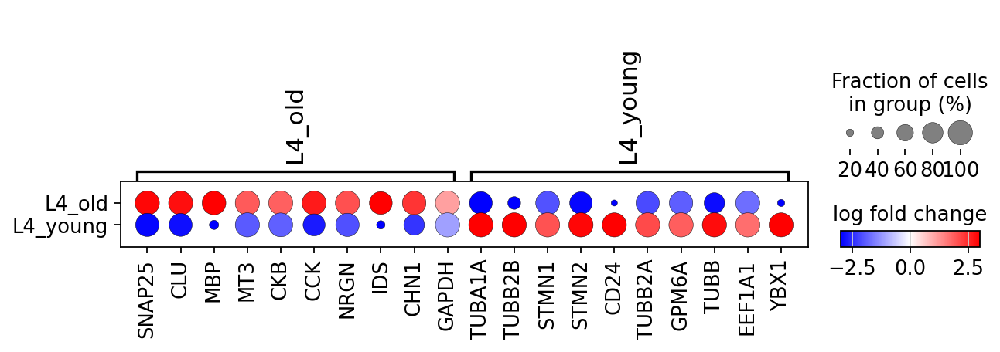

In [26]:
sc.pl.rank_genes_groups_dotplot(de_adata, groupby="label", n_genes=10, values_to_plot='logfoldchanges',
                                min_logfoldchange=1, vmax=3, vmin=-3, cmap='bwr')

### Посмотрим на отдельные образцы

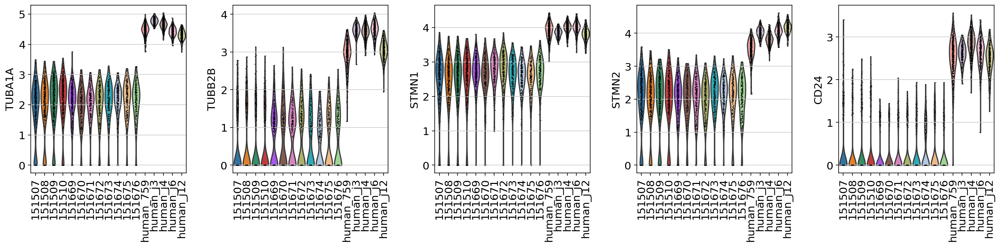

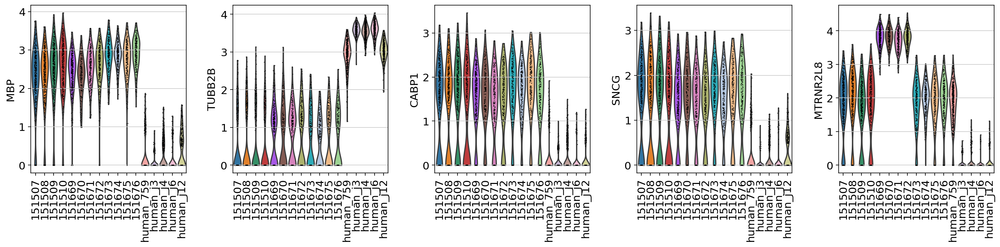

In [27]:
sc.pl.violin(de_adata, genes1[:5], groupby='sample_id', rotation=90)
sc.pl.violin(de_adata, genes2[:5], groupby='sample_id', rotation=90)

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


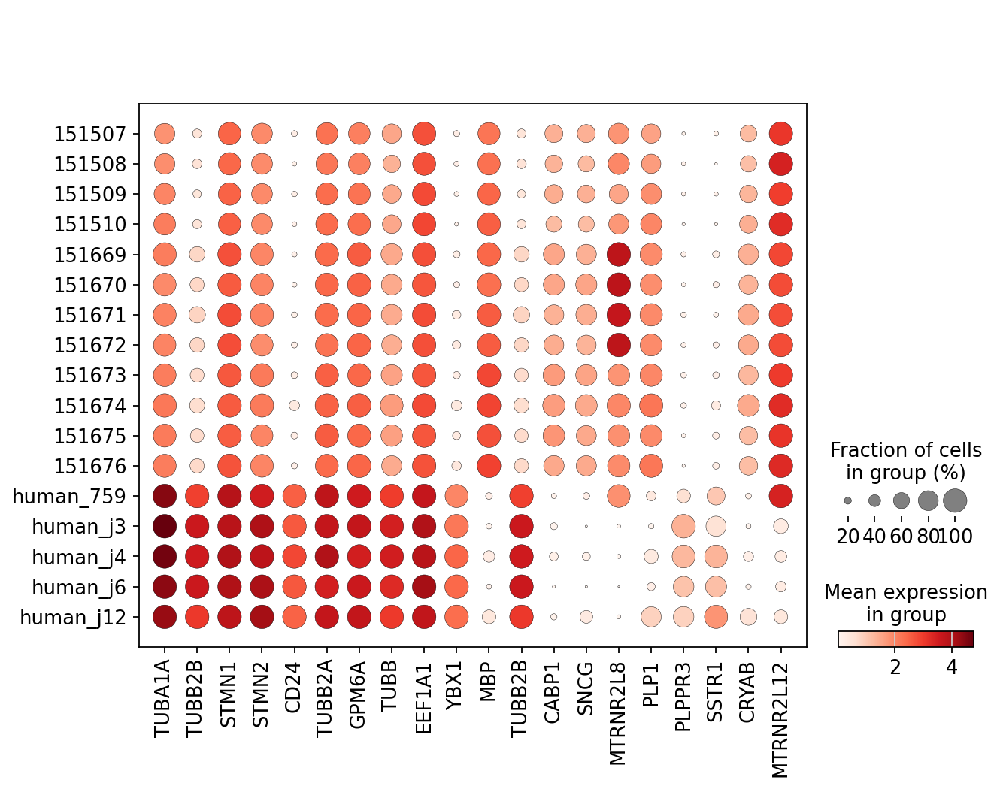

In [28]:
sc.pl.dotplot(de_adata, genes1 + genes2, groupby='sample_id')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample_id']`
categories: 151507, 151508, 151509, etc.
var_group_labels: L4_old, L4_young


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


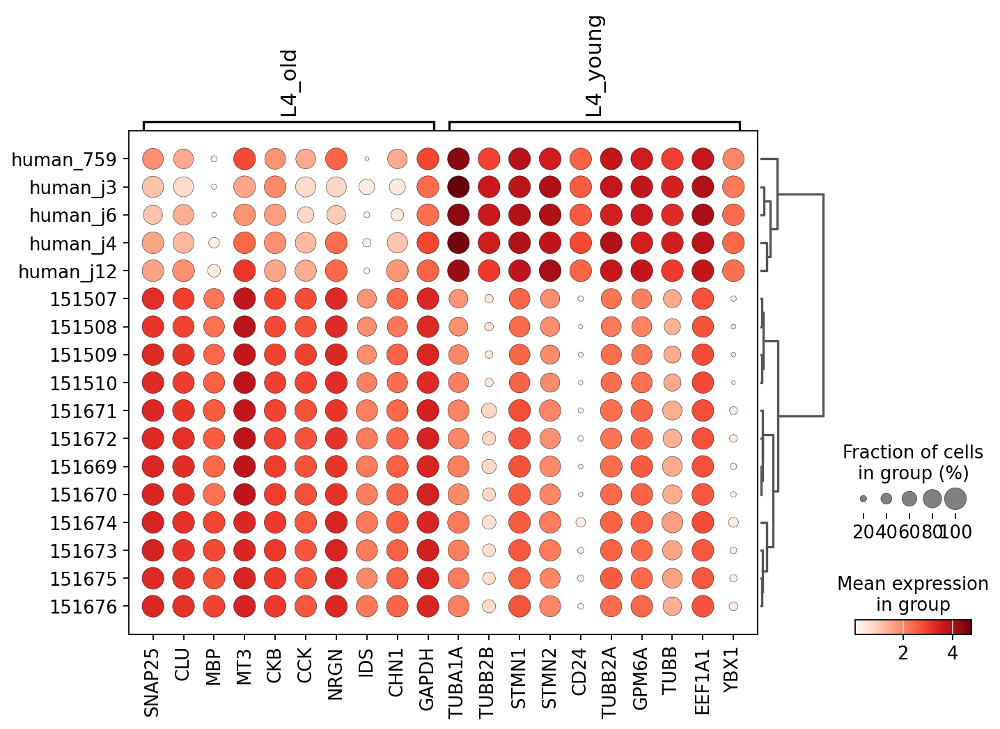

In [29]:
sc.pl.rank_genes_groups_dotplot(de_adata, groupby="sample_id", n_genes=10)

### Сохраним csv файл

In [30]:
genes_rank_df = sc.get.rank_genes_groups_df(de_adata, group=groups[0])
genes_rank_df.to_csv(dir_path + 'DE/young_vs_old_scanpy/' + key + '.csv')

## Gene Set Analysis

In [31]:
gene_set_names = gseapy.get_library_name(organism='Human')
gene_set_names[:5]
#gene_set_names

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues']

Выберем только дифференциально экспрессированые гены

In [48]:
gene_set = sc.get.rank_genes_groups_df(de_adata, group=groups[0], log2fc_min=1, pval_cutoff=0.01).set_index('names').loc[de_adata.var["highly_variable"]]
gene_set = gene_set[(gene_set.pct_nz_group > 0) & (gene_set.pct_nz_reference > 0)]
gene_list = gene_set.index.str.strip().tolist()
print(len(gene_list))

919


Возьмём базу данных `GO_Biological_Process_2021`

In [49]:
enr_res = gseapy.enrichr(gene_list=gene_list,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2021',
                     cutoff = 0.5)

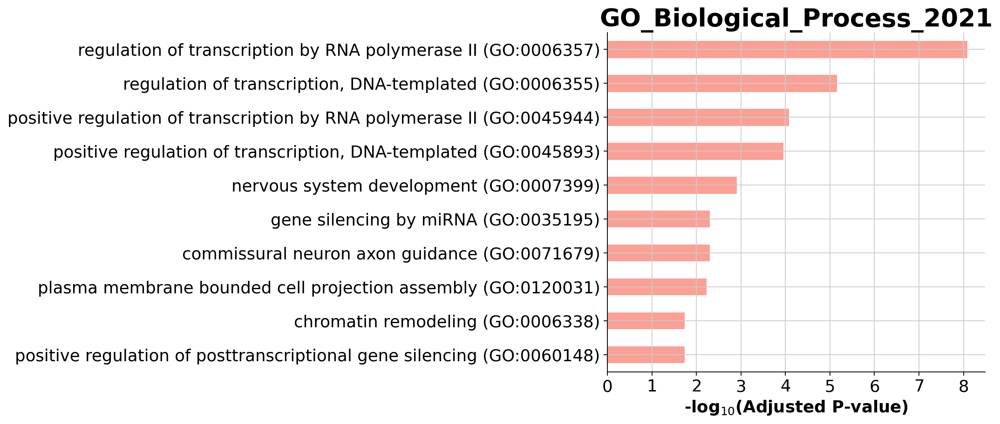

In [50]:
gseapy.barplot(enr_res.res2d, title='GO_Biological_Process_2021')

## GSEA

### Scores

In [35]:
scores = (
    sc.get.rank_genes_groups_df(de_adata, group=groups[0])
    .set_index('names')
    .loc[de_adata.var["highly_variable"]]
    .sort_values("scores", ascending=False)
    [['scores']]
    .rename_axis(["young_L1"], axis=1)
    )
scores

young_L1,scores
names,
TUBB2B,58.892376
EEF1A1,57.618217
MARCKSL1,56.479946
NREP,53.682003
ADCY1,52.259155
...,...
SCGB2A2,-48.119144
CCK,-54.049866
MT3,-55.462227


In [36]:
res = gseapy.prerank(rnk=scores, gene_sets='KEGG_2021_Human')

In [37]:
res.res2d.head()

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
Staphylococcus aureus infection,-0.802481,-2.543003,0.000000,0.000000,95,20,C1QB;CFH;C1S;FPR1;FCGR3A;C1QA;ICAM1;C1QC;ITGB2...,CFB;HLA-DQA1;C3;CFD;HLA-DRB5;HLA-DPB1;HLA-DQB1...
Viral myocarditis,-0.770960,-2.255158,0.000000,0.002257,60,16,CAV1;EIF4G3;SGCD;ICAM1;ITGB2;HLA-DQA1;HLA-A;HL...,HLA-A;HLA-DRB5;HLA-DPB1;HLA-DQB1;HLA-E;CCND1;H...
Antigen processing and presentation,-0.603734,-1.856869,0.010101,0.022570,78,19,NFYB;CREB1;HSPA1A;PSME2;HSPA1B;CD4;HLA-DQA1;HL...,HLA-DRB5;HLA-DPB1;HSPA2;HLA-DQB1;HLA-E;HLA-DRA...
Mineral absorption,-0.613697,-1.890763,0.000000,0.025580,60,19,SLC11A2;FTL;SLC30A1;ATP2B4;SLC39A4;SLC9A3;SLC4...,ATP1B2;MT1X;MT1G;MT2A;ATP1A2;TF;ATP1B1
Cardiac muscle contraction,-0.578292,-1.722825,0.007812,0.042507,87,16,CACNG4;TPM4;CACNG8;RYR2;ATP2A3;CACNG2;SLC9A7;C...,ATP1B2;TNNT2;ATP1A2;COX7A1;ATP1B1;COX6C


In [38]:
terms = res.res2d.index
terms[:20]

Index(['Staphylococcus aureus infection', 'Viral myocarditis',
       'Antigen processing and presentation', 'Mineral absorption',
       'Cardiac muscle contraction', 'Protein digestion and absorption',
       'Amyotrophic lateral sclerosis', 'Complement and coagulation cascades',
       'Synaptic vesicle cycle', 'Hematopoietic cell lineage',
       'Salivary secretion', 'Insulin secretion', 'Pancreatic secretion',
       'Diabetic cardiomyopathy', 'Non-alcoholic fatty liver disease',
       'Spliceosome', 'Pathways of neurodegeneration', 'Huntington disease',
       'Parkinson disease', 'Epstein-Barr virus infection'],
      dtype='object', name='Term')

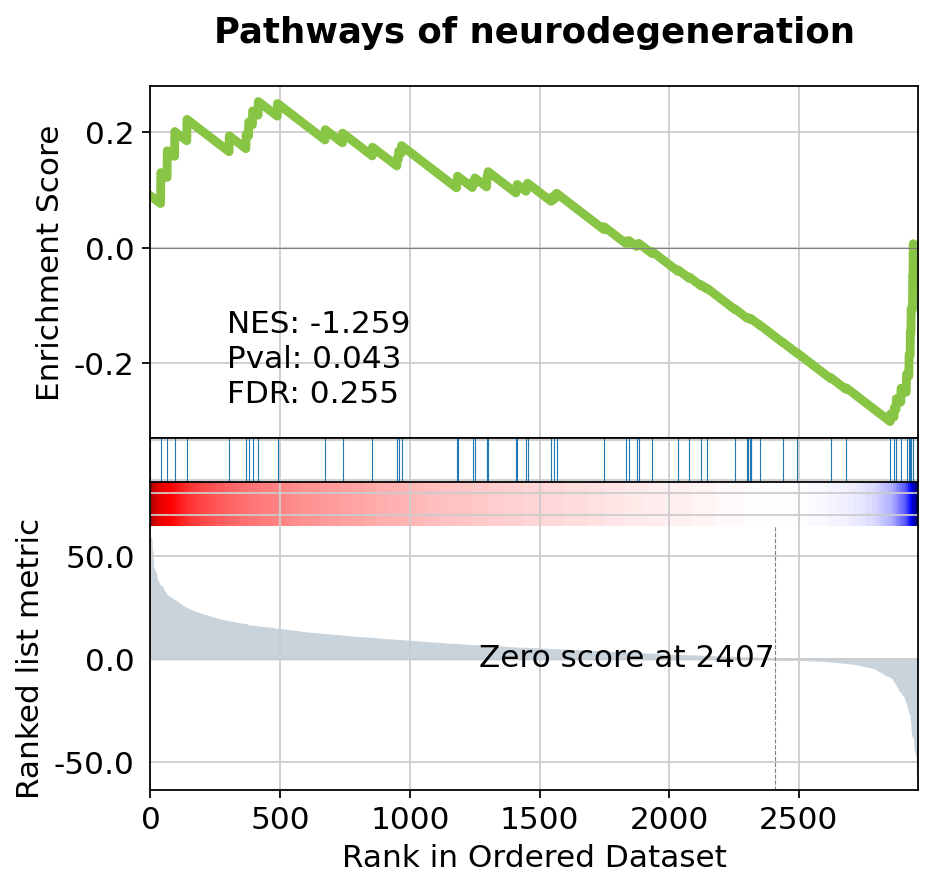

In [51]:
gseapy.gseaplot(rank_metric=res.ranking, term=terms[16], **res.results[terms[16]])